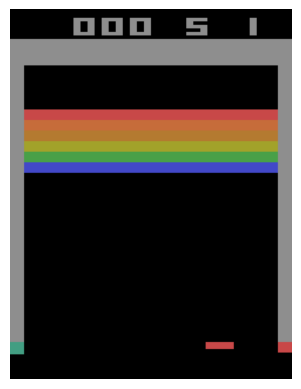

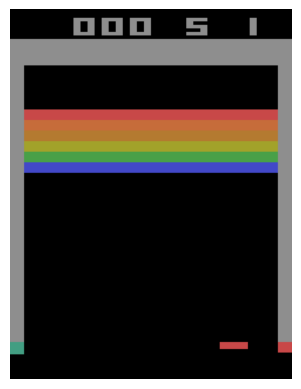

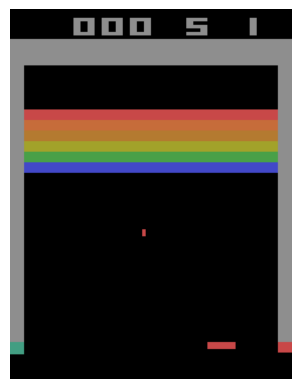

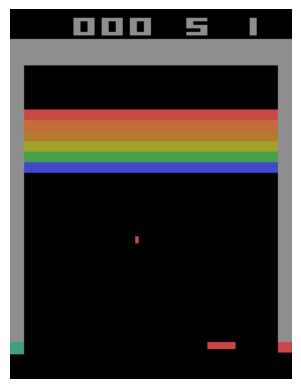

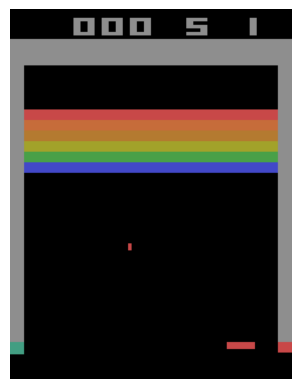

...

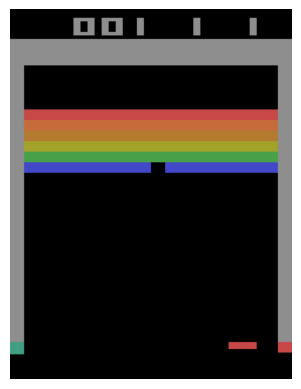

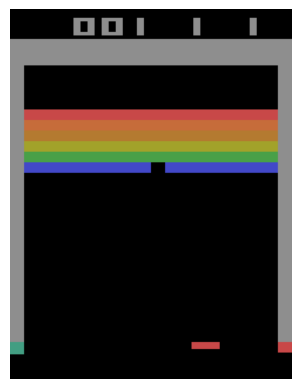

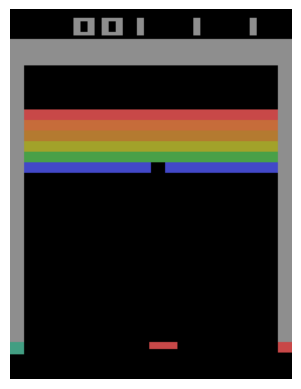

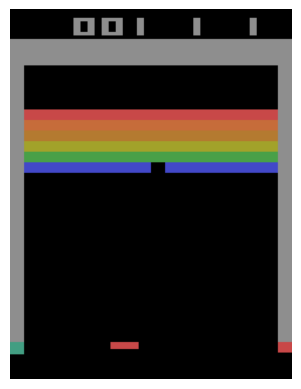

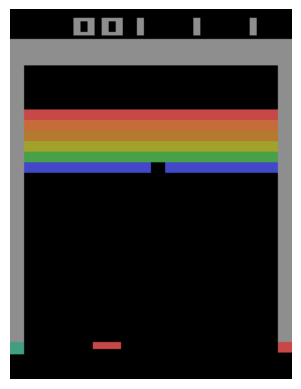

Episode 1 finished


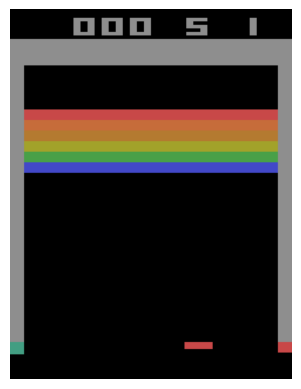

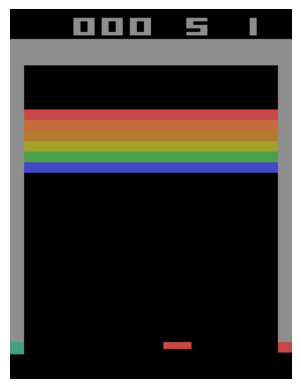

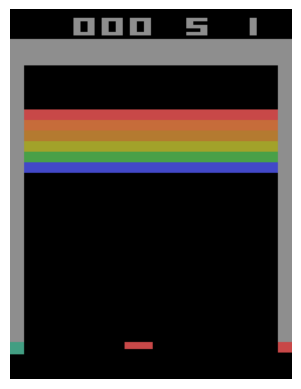

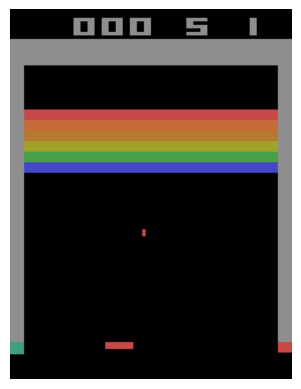

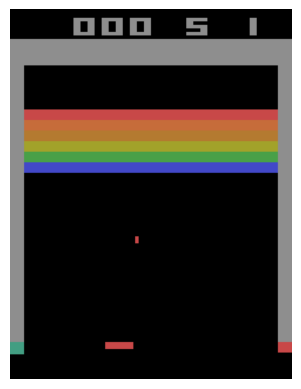

...

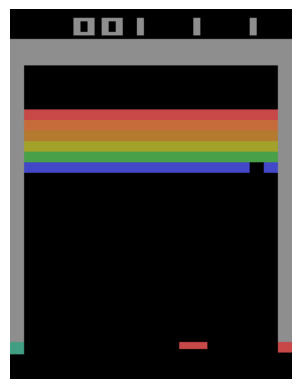

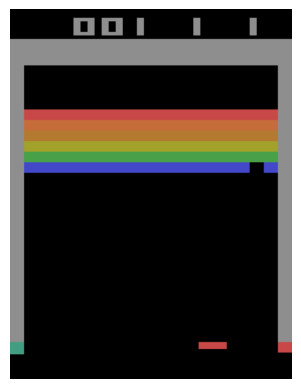

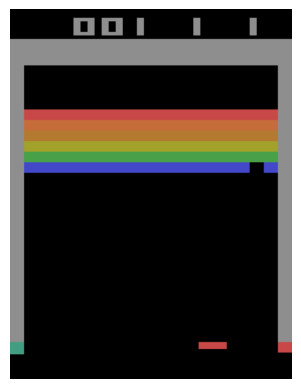

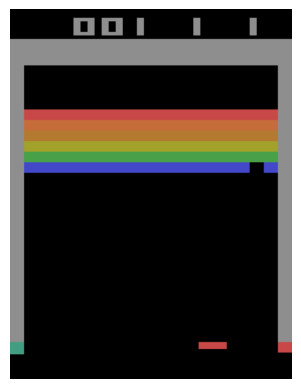

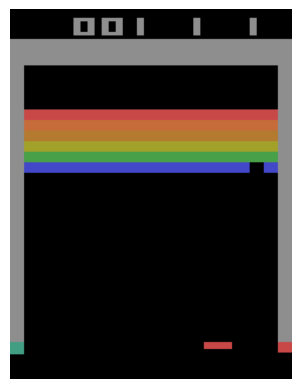

Episode 2 finished


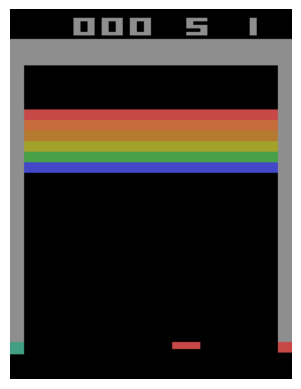

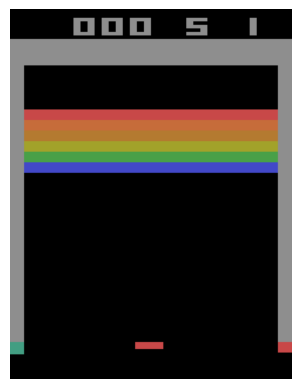

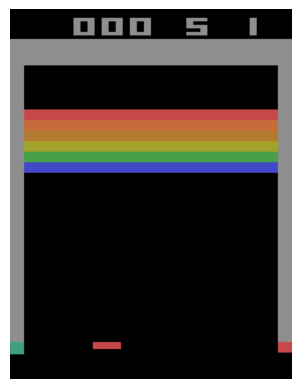

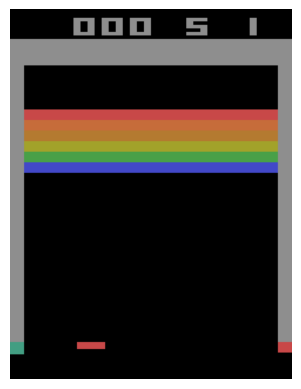

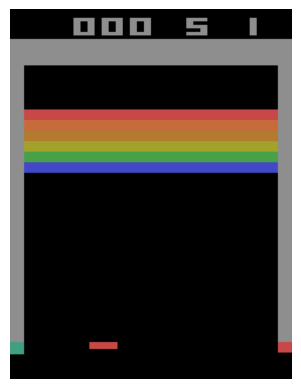

...

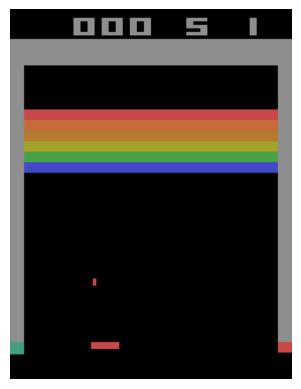

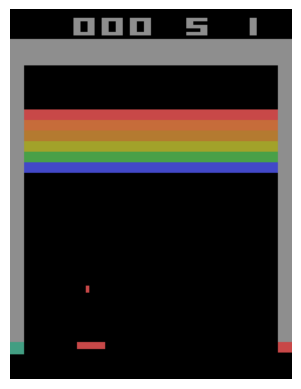

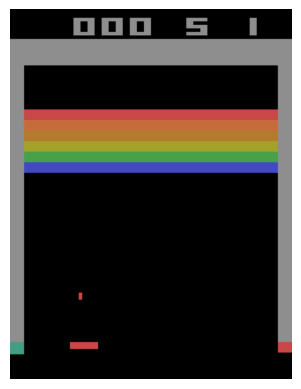

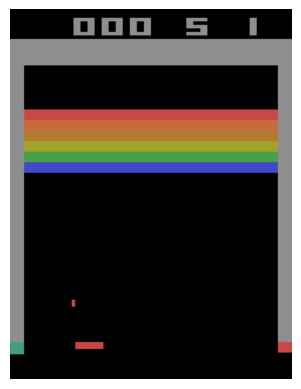

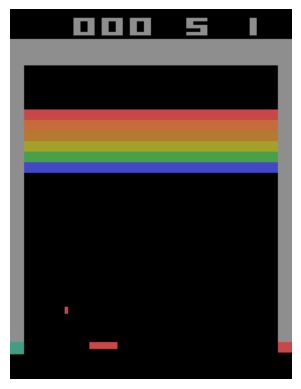

KeyboardInterrupt: 

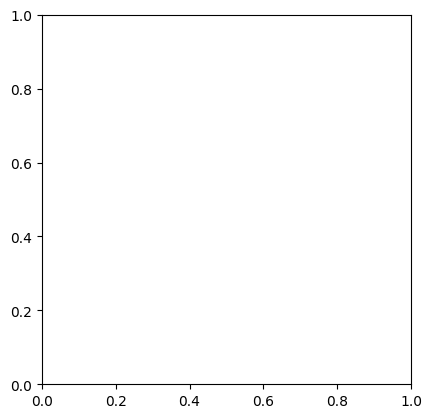

In [1]:
import gymnasium as gym
import ale_py
import numpy as np
import matplotlib.pyplot as plt

# Register ALE environments (this is not usually necessary if ale_py is installed properly)
gym.register_envs(ale_py)

# Create the Breakout environment
env = gym.make('ALE/Breakout-v5')
obs, info = env.reset()

# Number of episodes to play
num_episodes = 5

for episode in range(num_episodes):
    obs, info = env.reset()
    done = False
    while not done:
        action = env.action_space.sample()  # Take a random action
        obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated
        
        # Display the game frame
        plt.imshow(obs)
        plt.axis('off')  # Optional: Hide axes for better visualization
        plt.pause(0.01)  # Pause to create a frame-by-frame effect

    print(f"Episode {episode + 1} finished")

env.close()
plt.show()  # Display the final frame


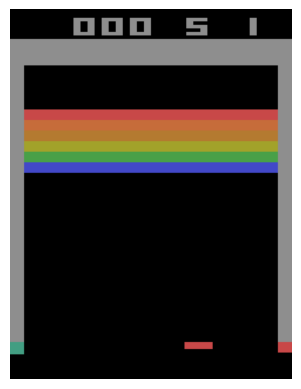

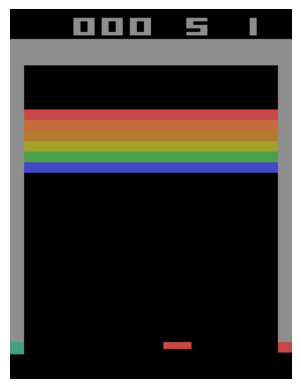

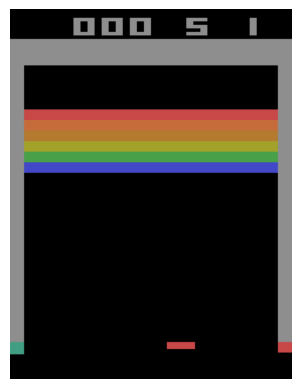

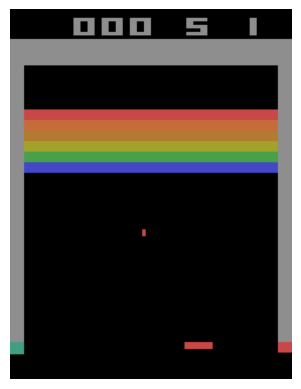

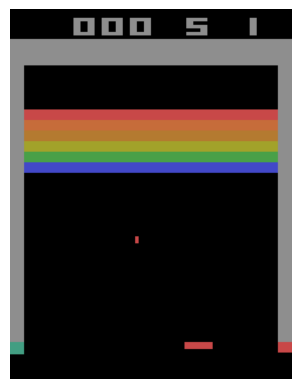

...

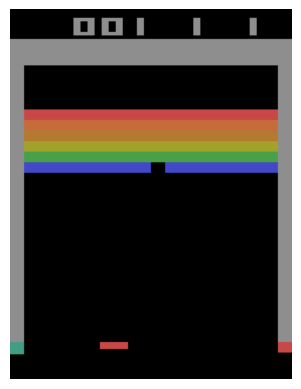

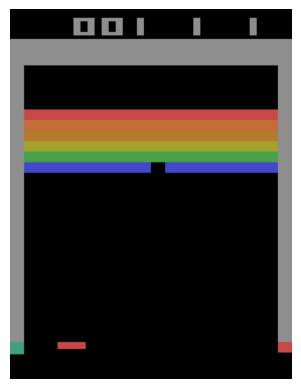

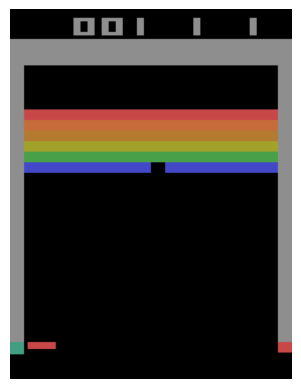

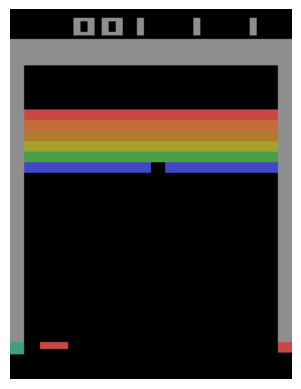

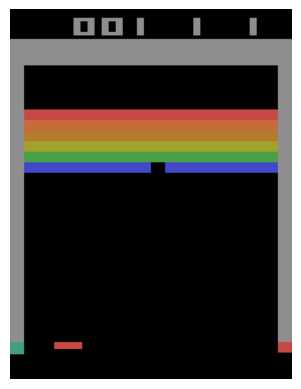

Episode 1 finished


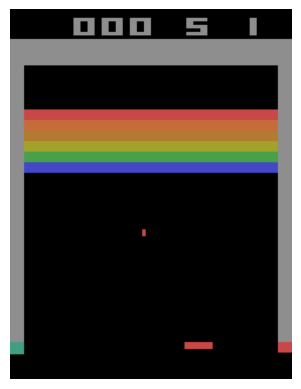

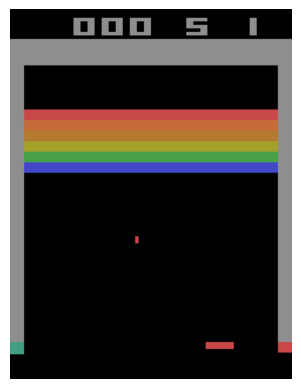

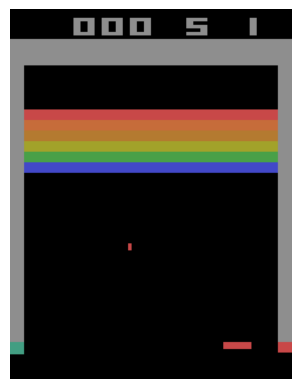

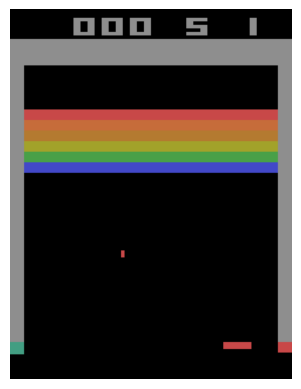

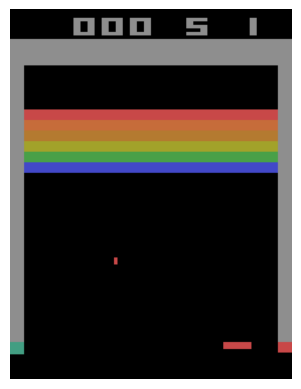

...

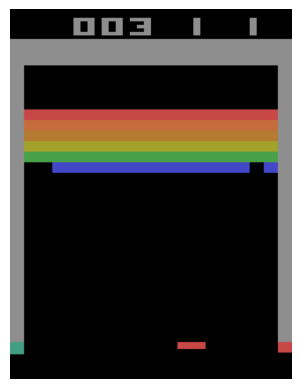

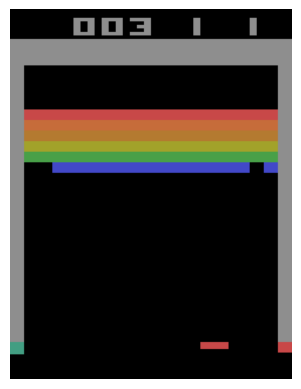

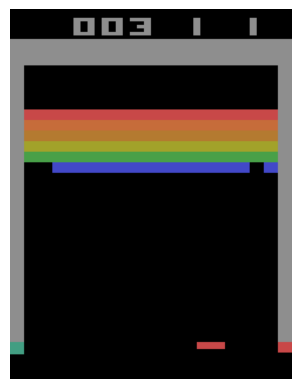

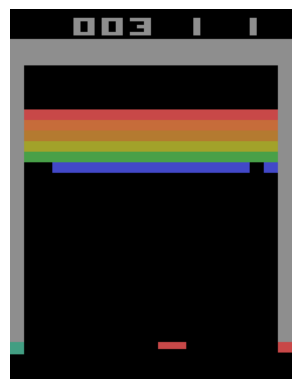

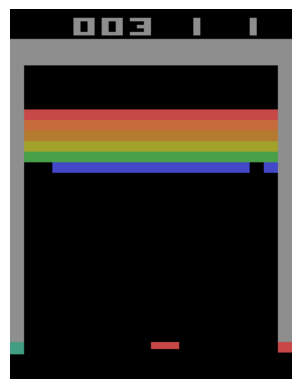

Episode 2 finished


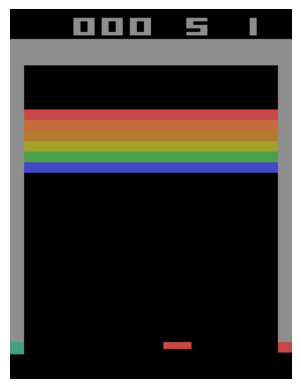

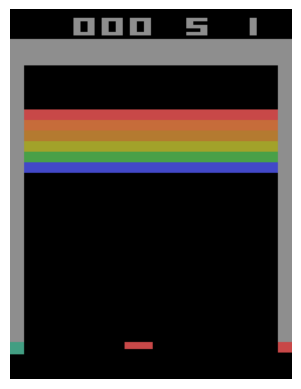

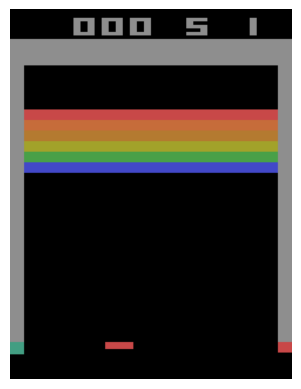

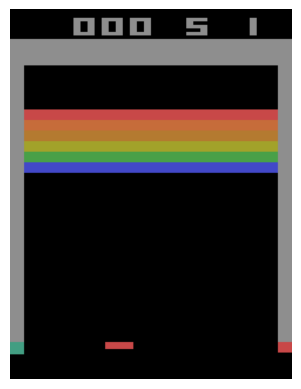

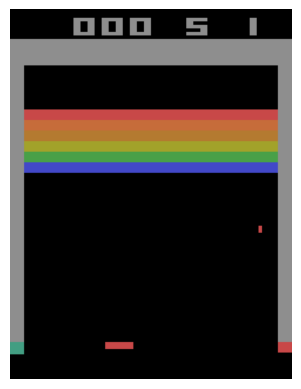

...

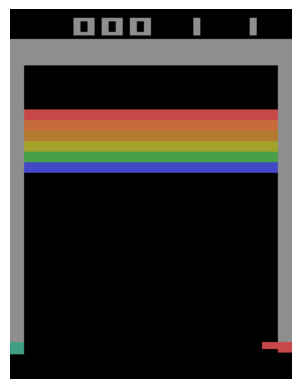

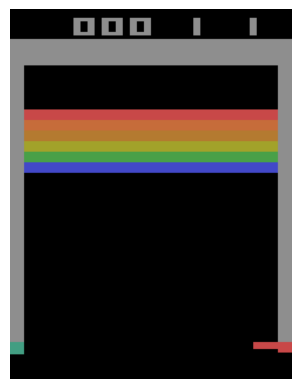

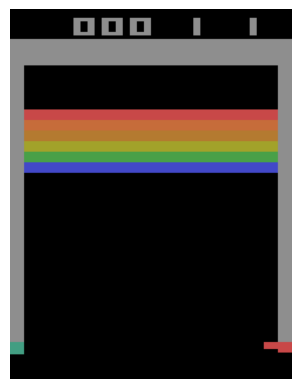

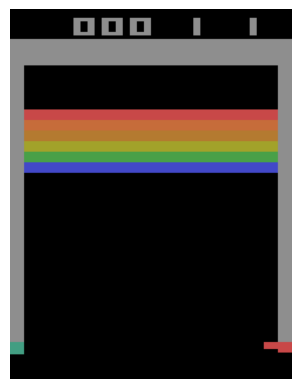

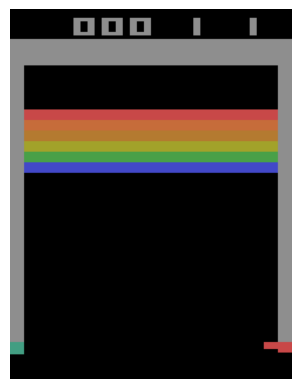

Episode 3 finished


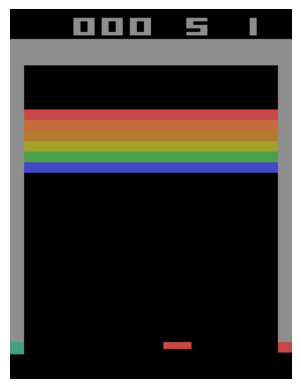

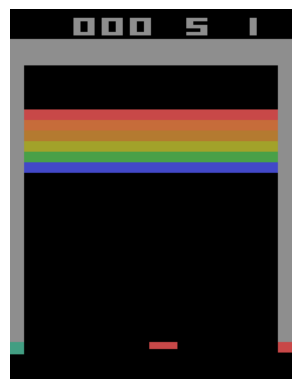

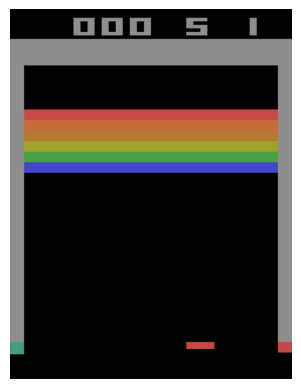

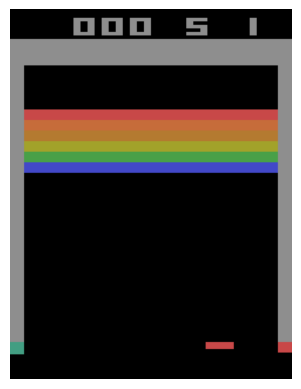

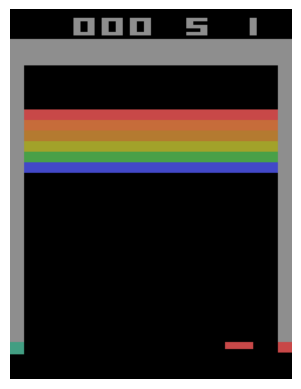

...

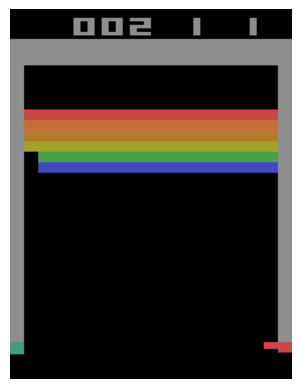

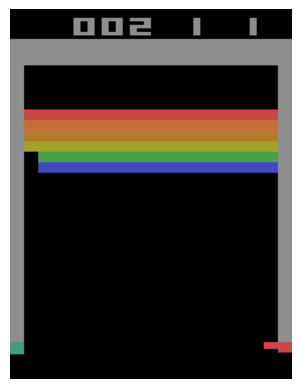

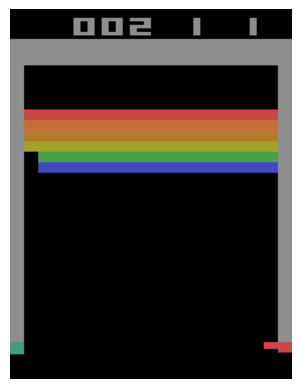

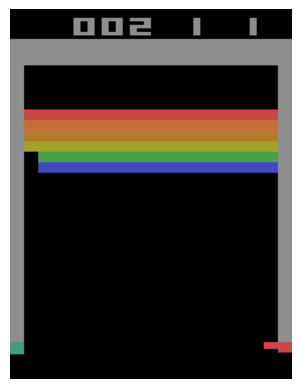

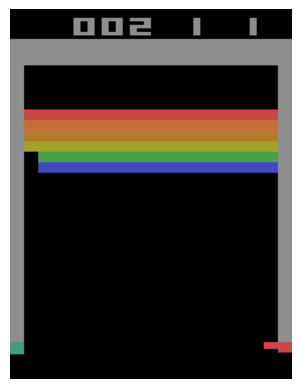

Episode 4 finished


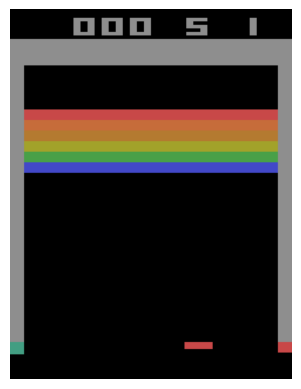

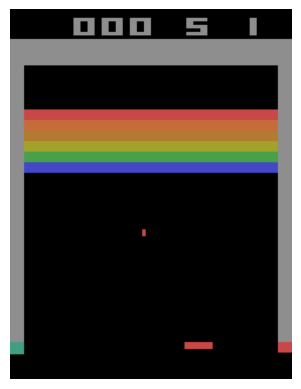

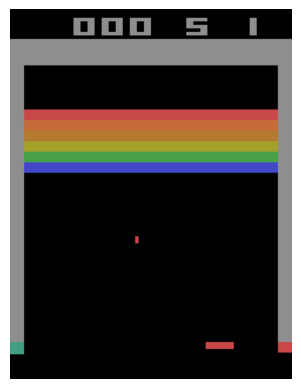

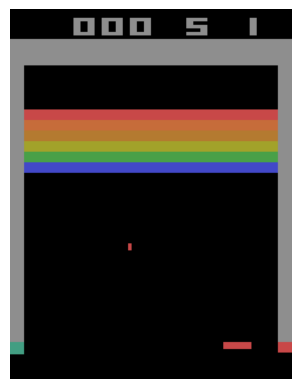

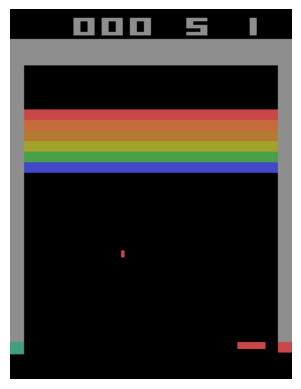

...

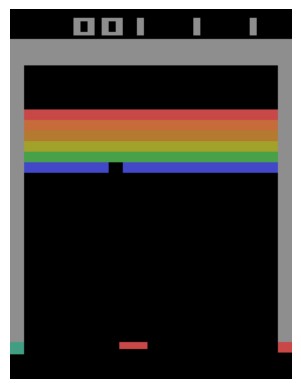

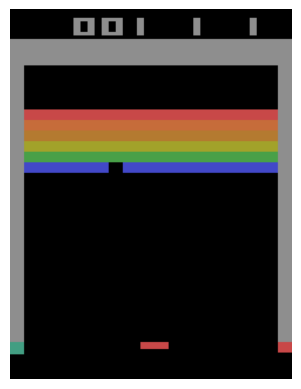

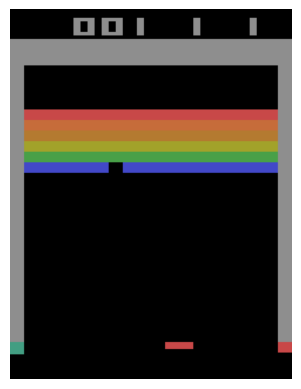

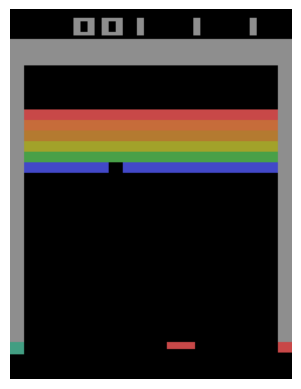

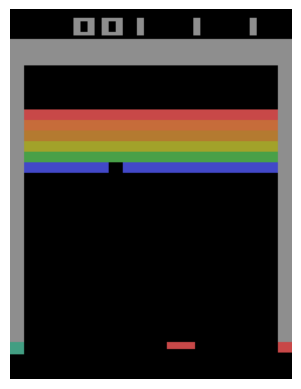

Episode 5 finished
Episode 1 finished with total reward: 3.0
Episode 2 finished with total reward: 3.0
Episode 3 finished with total reward: 2.0
Episode 4 finished with total reward: 1.0
Episode 5 finished with total reward: 2.0
Episode 6 finished with total reward: 2.0
Episode 7 finished with total reward: 2.0
Episode 8 finished with total reward: 0.0
Episode 9 finished with total reward: 2.0
Episode 10 finished with total reward: 5.0
Episode 11 finished with total reward: 0.0
Episode 12 finished with total reward: 1.0
Episode 13 finished with total reward: 0.0
Episode 14 finished with total reward: 2.0
Episode 15 finished with total reward: 0.0


In [2]:
import gymnasium as gym
import ale_py
import numpy as np
import matplotlib.pyplot as plt
import pickle

# Register ALE environments (this is not usually necessary if ale_py is installed properly)
gym.register_envs(ale_py)

# Create the Breakout environment
env = gym.make('ALE/Breakout-v5')
obs, info = env.reset()

# Number of episodes to play
num_episodes = 5

for episode in range(num_episodes):
    obs, info = env.reset()
    done = False
    while not done:
        action = env.action_space.sample()  # Take a random action
        obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated
        
        # Display the game frame
        plt.imshow(obs)
        plt.axis('off')  # Optional: Hide axes for better visualization
        plt.pause(0.01)  # Pause to create a frame-by-frame effect

    print(f"Episode {episode + 1} finished")

env.close()
plt.show()  # Display the final frame

# Define Q-learning parameters
alpha = 0.1  # Learning rate
gamma = 0.99  # Discount factor
epsilon = 1.0  # Exploration rate
epsilon_decay = 0.995  # Decay rate for exploration
min_epsilon = 0.01  # Minimum exploration rate

# Initialize Q-table
q_table = np.zeros((env.observation_space.shape[0], env.action_space.n))

# Function to choose an action using epsilon-greedy policy
def choose_action(state):
    if np.random.rand() < epsilon:
        return env.action_space.sample()  # Explore
    else:
        return np.argmax(q_table[state])  # Exploit

# Training loop
num_episodes = 15
for episode in range(num_episodes):
    state, info = env.reset()
    done = False
    total_reward = 0

    while not done:
        action = choose_action(state)
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated

        # Update Q-value
        best_next_action = np.argmax(q_table[next_state])
        td_target = reward + gamma * q_table[next_state, best_next_action]
        td_error = td_target - q_table[state, action]
        q_table[state, action] += alpha * td_error

        state = next_state
        total_reward += reward

    # Decay ,. epsilon
    if epsilon > min_epsilon:
        epsilon *= epsilon_decay

    print(f"Episode {episode + 1} finished with total reward: {total_reward}")

# Save the Q-table to a file
with open('q_table.pkl', 'wb') as f:
    pickle.dump(q_table, f)

env.close()


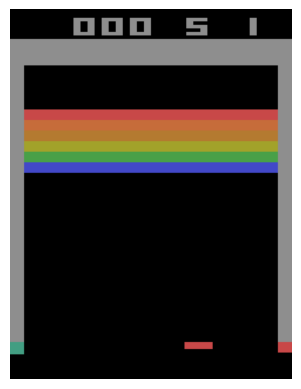

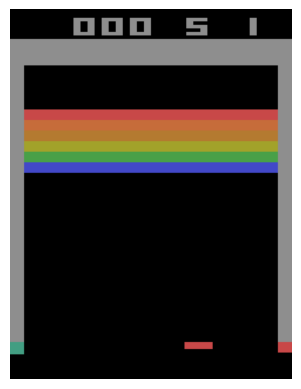

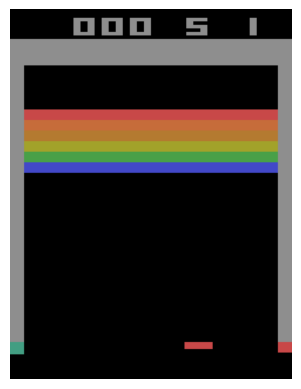

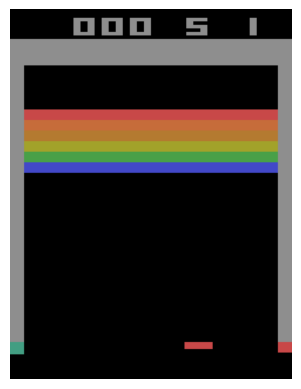

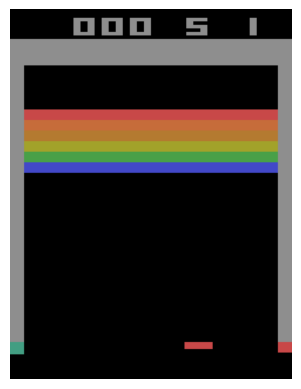

...

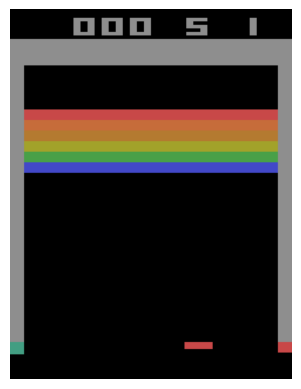

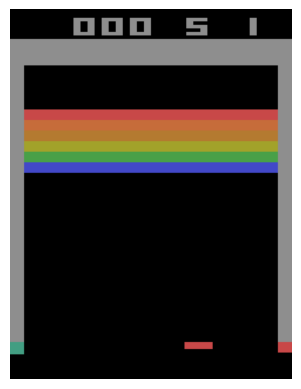

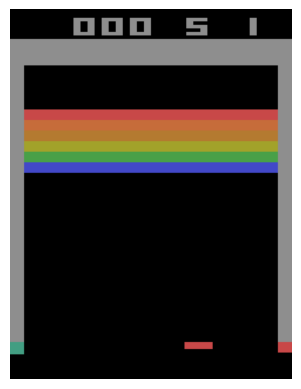

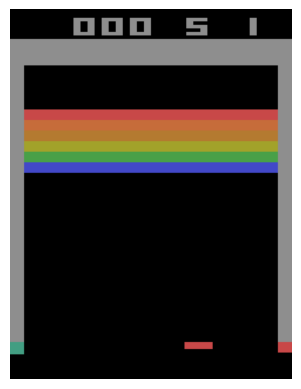

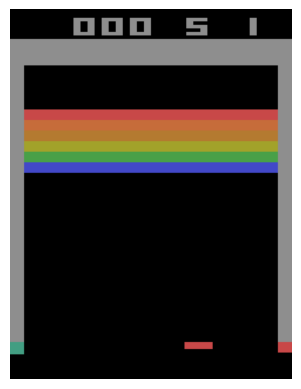

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

In [3]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import gymnasium as gym
import ale_py

# Register ALE environments (this is not usually necessary if ale_py is installed properly)
gym.register_envs(ale_py)

# Create the Breakout environment
env = gym.make('ALE/Breakout-v5')


# Load the Q-table from the file
with open('q_table.pkl', 'rb') as f:
    q_table = pickle.load(f)

# Play using the loaded Q-table
num_episodes = 5
for episode in range(num_episodes):
    state, info = env.reset()
    done = False
    total_reward = 0

    while not done:
        action = np.argmax(q_table[state])  # Choose the best action from Q-table
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated

        state = next_state
        total_reward += reward

        # Display the game frame
        plt.imshow(state)
        plt.axis('off')  # Optional: Hide axes for better visualization
        plt.pause(0.01)  # Pause to create a frame-by-frame effect

    print(f"Episode {episode + 1} finished with total reward: {total_reward}")

env.close()
plt.show()  # Display the final frame